# Behaviour Space Analysis -- GA-LLaMEA Experiments

Replicates the two-step methodology from:
> van Stein et al. (2025) Behaviour Space Analysis of LLM-driven Meta-heuristic Discovery

## Methodology (matching the paper)

Data scope: ALL generated algorithms from each experiment (~500 per method).
Each algorithm is a unique piece of code from the LLaMEA/EoH search.
The AOCC fitness for each algorithm comes directly from the experiment log.

Step 1 -- Correlation heatmap (feature selection):
Compute Pearson r between all 11 behaviour metrics + normalised AOCC.
Identify redundant pairs (|r| > 0.7) and drop one from each pair.
The paper selected: Expl %, Conv-rate, Delta fitness, Success %, No-imp streak.

Step 2 -- Parallel coordinates (gold standard profile):
Plot all generated algorithms as polylines coloured by AOCC quartile.
Q4 (dark red) lines reveal the behaviour profile of successful algorithms.

---
Experiments:
| Method | Experiment Dir |
|--------|----------------|
| EoH | ../results/EoH |
| Baseline-LLaMEA | ../results/CROSSOVER-ABLATION/baseline-LLAMEA |
| GA-LLAMEA-8-INIT-100 | ../results/GA-LLAMEA-8-INIT-100 |

IOH trajectory data is stored in ../results/ioh-all/{method}/{algo_id}/.
Runs are skipped if the folder already exists so execution is resumable.

## 1. Setup

In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pandas.plotting import parallel_coordinates
from IPython.display import display
from tqdm.std import tqdm
import polars as pl

import ioh
from ioh import logger as ioh_logger
import iohinspector
import iohblade as _iohblade
from iohblade.loggers import ExperimentLogger
from iohblade.behaviour_metrics import compute_behavior_metrics
from iohblade.utils import budget_logger
from iohblade import OverBudgetException

plt.rcParams.update({
    'figure.figsize': (14, 9),
    'font.size': 12,
    'axes.grid': True,
    'grid.alpha': 0.3,
})
sns.set_palette('colorblind')
print('All imports successful.')

c:\Users\Kukoy\Documents\Experiment-GA\WORKING-GA-LLAMEA\venv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


All imports successful.


## 2. Configuration

In [2]:
EXPERIMENT_DIRS = [
    '../results/EoH',
    '../results/CROSSOVER-ABLATION/baseline-LLAMEA',
    '../results/GA-LLAMEA-8-INIT-100',
]
IOH_ALL_DIR = '../results/ioh-all'

# Number of MA_BBOB instances and repetitions per algorithm for trajectory data.
# The paper uses 5 training instances per BBOB function x 10 functions = 50 runs.
# Reduce N_INSTANCES or N_REPS to speed up; increase for more statistical power.
N_INSTANCES = 5   # instances 100..104
N_REPS      = 2   # repetitions per instance

DIM    = 5
BUDGET = 2000 * DIM  # 10 000
F_MIN, F_MAX = 1e-8, 1e2

ALL_FEATS = [
    'avg_nearest_neighbor_distance',
    'dispersion',
    'avg_exploration_pct',
    'avg_distance_to_best',
    'intensification_ratio',
    'avg_exploitation_pct',
    'average_convergence_rate',
    'avg_improvement',
    'success_rate',
    'longest_no_improvement_streak',
    'last_improvement_fraction',
]

STN_FEATS = [
    'avg_exploration_pct',
    'average_convergence_rate',
    'avg_improvement',
    'success_rate',
    'longest_no_improvement_streak',
]

NICE_NAMES = {
    'avg_nearest_neighbor_distance': 'NN-dist',
    'dispersion':                    'Disp',
    'avg_exploration_pct':           'Expl %',
    'avg_distance_to_best':          'Dist->best',
    'intensification_ratio':         'Inten-ratio',
    'avg_exploitation_pct':          'Explt %',
    'average_convergence_rate':      'Conv-rate',
    'avg_improvement':               'Delta fitness',
    'success_rate':                  'Success %',
    'longest_no_improvement_streak': 'No-imp streak',
    'last_improvement_fraction':     'Last-imp frac',
    'aocc_norm':                     'Norm. fitness',
}

METHOD_COLORS = {
    'EoH':                  '#E69F00',
    'Baseline-LLaMEA':      '#56B4E9',
    'GA-LLAMEA-8-INIT-100': '#009E73',
}

QUARTILE_LABELS = ['Q1 (low)', 'Q2', 'Q3', 'Q4 (high)']
QUART_CAT = pd.CategoricalDtype(categories=QUARTILE_LABELS, ordered=True)
REDUNDANCY_THRESHOLD = 0.7

print('Configuration ready.')

Configuration ready.


## 3. Load All Generated Algorithms

Loads every algorithm produced across all LLaMEA/EoH runs (~500 per method).
The fitness column is the AOCC score from the experiment log -- the same metric
the paper uses as the performance signal.

In [3]:
exp_logger = ExperimentLogger(EXPERIMENT_DIRS[0], True)
for d in EXPERIMENT_DIRS[1:]:
    exp_logger.add_read_dir(d)

methods, problems = exp_logger.get_methods_problems()
print(f'Methods ({len(methods)}): {sorted(methods)}')

all_algos = exp_logger.get_problem_data('MA_BBOB')
all_algos.replace([-np.inf], 0, inplace=True)
all_algos.fillna(0, inplace=True)
all_algos = all_algos[all_algos['code'].notna() & (all_algos['code'] != '')].copy()

print(f'Total algorithms: {len(all_algos)}')
print()
print(all_algos.groupby('method_name').size().rename('num_algorithms'))
print()
print('AOCC range per method:')
print(all_algos.groupby('method_name')['fitness'].agg(['min','mean','max']).round(4))

Methods (3): ['Baseline-LLaMEA', 'EoH', 'GA-LLAMEA-8-INIT-100']
Total algorithms: 1497

method_name
Baseline-LLaMEA         500
EoH                     500
GA-LLAMEA-8-INIT-100    497
Name: num_algorithms, dtype: int64

AOCC range per method:
                      min    mean     max
method_name                              
Baseline-LLaMEA       0.0  0.5052  0.8566
EoH                   0.0  0.4943  0.8373
GA-LLAMEA-8-INIT-100  0.0  0.5934  0.8640


## 4. Load MA_BBOB Configuration

In [4]:
MABBOB_DIR = os.path.join(os.path.dirname(_iohblade.__file__), 'problems', 'mabbob')
weights  = pd.read_csv(os.path.join(MABBOB_DIR, 'weights.csv'),  index_col=0)
iids_df  = pd.read_csv(os.path.join(MABBOB_DIR, 'iids.csv'),     index_col=0)
opt_locs = pd.read_csv(os.path.join(MABBOB_DIR, 'opt_locs.csv'), index_col=0)
print(f'MA_BBOB config loaded from: {MABBOB_DIR}')

MA_BBOB config loaded from: c:\Users\Kukoy\Documents\Experiment-GA\WORKING-GA-LLAMEA\venv\Lib\site-packages\iohblade\problems\mabbob


## 5. Generate IOH Trajectory Data for All Algorithms

Runs each algorithm on N_INSTANCES MA_BBOB instances x N_REPS repetitions
and saves the trajectory to IOH_ALL_DIR/{method}/{algo_id}/.

Skips any algorithm whose output folder already exists -- so you can
interrupt and re-run this cell without losing progress.

**Fix for GA-LLAMEA missing data:** GA-LLAMEA's generative crossover produces
algorithms that import `collections`, `deque`, `math.gamma`, etc.
The original `safe_globals = {'np': np}` was too restrictive, causing 123/497
algorithms to crash before logging any evaluations (empty .dat files).
This cell now:
1. Detects and removes broken folders (folder exists but .dat is 0 bytes or missing).
2. Uses an expanded `safe_globals` so those algorithms can run correctly.

With N_INSTANCES=5, N_REPS=2 (~10 runs per algorithm x 1498 algorithms)
expect 30-90 minutes depending on algorithm complexity.

In [5]:
import shutil
import collections
import math
import random
import bisect
import scipy.stats as _scipy_stats

# ── expanded sandbox: covers stdlib modules GA-LLAMEA algorithms commonly use ──
SAFE_GLOBALS = {
    'np':          np,
    'math':        math,
    'gamma':       math.gamma,            # ~28 GA-LLAMEA algorithms
    'collections': collections,           # ~40 GA-LLAMEA algorithms
    'deque':       collections.deque,     # ~47 GA-LLAMEA algorithms
    'random':      random,                # random stdlib module
    'bisect':      bisect,                # bisect stdlib module
    'cauchy':      _scipy_stats.cauchy,   # ~11 GA-LLAMEA algorithms
}

# ── helper: returns True if the folder exists but produced no usable data ──────
def _is_broken_folder(folder_path):
    """
    A folder is 'broken' if it was created (so it would be skipped) but the
    algorithm crashed before the IOH logger flushed any data.
    Symptom: no top-level .json file (IOH never finalised the run).
    """
    if not os.path.isdir(folder_path):
        return False
    items = os.listdir(folder_path)
    has_json = any(f.endswith('.json') for f in items)
    return not has_json

# ── scan and remove broken folders before the main loop ────────────────────────
print("Scanning for broken folders (algorithm crashed before logging any data)...")
cleaned = 0
for method in sorted(methods):
    method_dir = os.path.join(IOH_ALL_DIR, method)
    if not os.path.isdir(method_dir):
        continue
    for algo_folder in os.listdir(method_dir):
        fp = os.path.join(method_dir, algo_folder)
        if _is_broken_folder(fp):
            shutil.rmtree(fp)
            cleaned += 1
print(f"Removed {cleaned} broken folders -- they will be re-run with the expanded sandbox.\n")

# ── main generation loop ────────────────────────────────────────────────────────
os.makedirs(IOH_ALL_DIR, exist_ok=True)
skipped = completed = errors = 0

for method in sorted(methods):
    method_algos = all_algos[all_algos['method_name'] == method]
    method_dir   = os.path.join(IOH_ALL_DIR, method)
    os.makedirs(method_dir, exist_ok=True)
    print(f'\n[{method}] -- {len(method_algos)} algorithms')

    for _, row in tqdm(method_algos.iterrows(), total=len(method_algos), desc=method):
        algo_id   = str(row['id'])
        algo_name = str(row['name'])
        alg_code  = str(row['code'])
        out_dir   = os.path.join(method_dir, algo_id)

        if os.path.isdir(out_dir):
            skipped += 1
            continue

        try:
            analyzer = ioh_logger.Analyzer(
                triggers=[ioh_logger.trigger.ALWAYS],
                folder_name=out_dir,
                algorithm_name=algo_id,
                store_positions=True,
            )
            bl = budget_logger(budget=BUDGET)
            l1 = ioh_logger.Combine([bl, analyzer])

            for iid in range(100, 100 + N_INSTANCES):
                problem = ioh.problem.ManyAffine(
                    xopt=np.array(opt_locs.iloc[iid])[:DIM],
                    weights=np.array(weights.iloc[iid]),
                    instances=np.array(iids_df.iloc[iid], dtype=int),
                    n_variables=DIM,
                )
                problem.set_id(100)
                problem.set_instance(iid)
                problem.attach_logger(l1)

                for rep in range(N_REPS):
                    np.random.seed(rep)
                    try:
                        local_env = {}
                        exec(alg_code, SAFE_GLOBALS.copy(), local_env)
                        algorithm = local_env[algo_name](budget=BUDGET, dim=DIM)
                        algorithm(problem)
                    except OverBudgetException:
                        pass
                    except Exception:
                        pass
                    problem.reset()

            completed += 1

        except Exception as e:
            errors += 1
            if os.path.isdir(out_dir):
                shutil.rmtree(out_dir)

print(f'\nDone. Completed: {completed}, Skipped: {skipped}, Errors: {errors}')
print(f'Expected GA-LLAMEA coverage after fix: ~465/497 (up from 373/497).')

Scanning for broken folders (algorithm crashed before logging any data)...
Removed 47 broken folders -- they will be re-run with the expanded sandbox.


[Baseline-LLaMEA] -- 500 algorithms


Baseline-LLaMEA: 100%|██████████| 500/500 [00:00<00:00, 588.43it/s]



[EoH] -- 500 algorithms


EoH: 100%|██████████| 500/500 [00:00<00:00, 889.44it/s]



[GA-LLAMEA-8-INIT-100] -- 497 algorithms


GA-LLAMEA-8-INIT-100: 100%|██████████| 497/497 [00:00<00:00, 1508.20it/s]


Done. Completed: 47, Skipped: 1450, Errors: 0
Expected GA-LLAMEA coverage after fix: ~465/497 (up from 373/497).


## 6. Compute Behaviour Metrics per Algorithm

Loads the trajectory for each algorithm and computes behaviour metrics.
Metrics are aggregated (median) over all (instance, run_id) pairs,
giving one behaviour vector per algorithm -- matching the paper's approach
where each algorithm is one point in behaviour space.

AOCC fitness is taken directly from the experiment log.

In [6]:
behaviour_records = []

for method in sorted(methods):
    method_algos = all_algos[all_algos['method_name'] == method]
    method_dir   = os.path.join(IOH_ALL_DIR, method)
    print(f'\n  Loading: {method}')

    for _, row in tqdm(method_algos.iterrows(), total=len(method_algos), desc=method):
        algo_id = str(row['id'])
        out_dir = os.path.join(method_dir, algo_id)

        if not os.path.isdir(out_dir):
            continue

        try:
            m = iohinspector.DataManager()
            m.add_folder(out_dir)
            df_traj = m.load(monotonic=False, include_meta_data=True).to_pandas()
        except Exception:
            continue

        if df_traj.empty:
            continue

        run_metrics = []
        for (inst, run), grp in df_traj.groupby(['instance', 'run_id']):
            grp = grp.sort_values('evaluations').reset_index(drop=True)
            if len(grp) < 10:
                continue
            try:
                m_dict = compute_behavior_metrics(grp)
            except Exception:
                m_dict = {f: np.nan for f in ALL_FEATS}
            run_metrics.append(m_dict)

        if not run_metrics:
            continue

        # Median over all runs -- one point per algorithm (matching the paper)
        agg = pd.DataFrame(run_metrics)[ALL_FEATS].median().to_dict()
        agg['algo_id']     = algo_id
        agg['method_name'] = method
        agg['aocc']        = float(row['fitness'])
        agg['generation']  = int(row['generation']) if pd.notna(row.get('generation')) else -1
        behaviour_records.append(agg)

df_beh = pd.DataFrame(behaviour_records)
df_beh.replace([np.inf, -np.inf], np.nan, inplace=True)
df_beh.fillna(0, inplace=True)

print(f'\nBehaviour DataFrame: {df_beh.shape}')
print(df_beh.groupby('method_name').size().rename('algorithms_with_data'))
df_beh[ALL_FEATS + ['aocc']].describe().round(4)


  Loading: Baseline-LLaMEA


Baseline-LLaMEA: 100%|██████████| 500/500 [20:54<00:00,  2.51s/it]



  Loading: EoH


EoH: 100%|██████████| 500/500 [18:01<00:00,  2.16s/it]



  Loading: GA-LLAMEA-8-INIT-100


GA-LLAMEA-8-INIT-100: 100%|██████████| 497/497 [28:19<00:00,  3.42s/it]



Behaviour DataFrame: (1442, 15)
method_name
Baseline-LLaMEA         472
EoH                     482
GA-LLAMEA-8-INIT-100    488
Name: algorithms_with_data, dtype: int64


,avg_nearest_neighbor_distance,dispersion,avg_exploration_pct,avg_distance_to_best,intensification_ratio,avg_exploitation_pct,average_convergence_rate,avg_improvement,success_rate,longest_no_improvement_streak,last_improvement_fraction,aocc
count,1442.0000,1442.0000,1442.0000,1442.0000,1442.0000,1442.0000,1442.0000,1442.0000,1442.0000,1442.0000,1442.0000,1442.0000
mean,0.9122,6.9473,26.6968,2.0914,0.6456,73.3032,0.9064,0.7499,0.0215,2725.2254,0.3007,0.5478
std,1.6927,1.4640,34.0275,2.9194,0.3727,34.0275,0.2373,1.3859,0.0437,2319.6015,0.2564,0.2374
min,0.0015,2.3120,0.0985,0.0015,0.0001,0.0000,0.0149,0.0011,0.0006,6.0000,0.0000,0.0000
25%,0.0920,6.3220,3.9225,0.2424,0.2566,65.2232,0.9962,0.1020,0.0060,784.6250,0.0454,0.3901
50%,0.1688,6.9922,8.5799,0.5498,0.8571,91.4201,0.9962,0.1393,0.0089,2113.7500,0.2615,0.5893
75%,0.4965,7.6913,34.7768,2.3857,0.9394,96.0775,0.9962,0.4299,0.0134,4548.5000,0.5496,0.7558
max,11.3798,13.5165,100.0000,11.8344,0.9996,99.9015,0.9965,6.1355,0.4925,9910.0000,0.9911,0.8640


## 7. Normalise AOCC Fitness

The paper normalises AOCC to [0, 1] per method (Section 4.3).

In [7]:
df = df_beh.copy()

df['aocc_norm'] = (
    df.groupby('method_name')['aocc']
      .transform(lambda s: (s - s.min()) / (s.max() - s.min() + 1e-12))
)

print('Normalised AOCC per method:')
print(df.groupby('method_name')[['aocc','aocc_norm']]
        .agg(['min','mean','max']).round(4))

Normalised AOCC per method:
                     aocc                 aocc_norm             
                      min    mean     max       min    mean  max
method_name                                                     
Baseline-LLaMEA       0.0  0.5315  0.8566       0.0  0.6204  1.0
EoH                   0.0  0.5081  0.8373       0.0  0.6068  1.0
GA-LLAMEA-8-INIT-100  0.0  0.6028  0.8640       0.0  0.6977  1.0


## 8. Step 1 -- Correlation Heatmap (Feature Selection)

Replicates Figure 3 from the paper.

This is a data-cleaning step, not a method comparison.
It verifies the metrics are complementary and flags redundant pairs:
- Expl % and Explt % (perfectly inversely correlated by design)
- Expl % with Dist->best
- Explt % with Inten-ratio
- Last-imp frac with No-imp streak

Only one feature from each pair is kept for the behaviour profile.

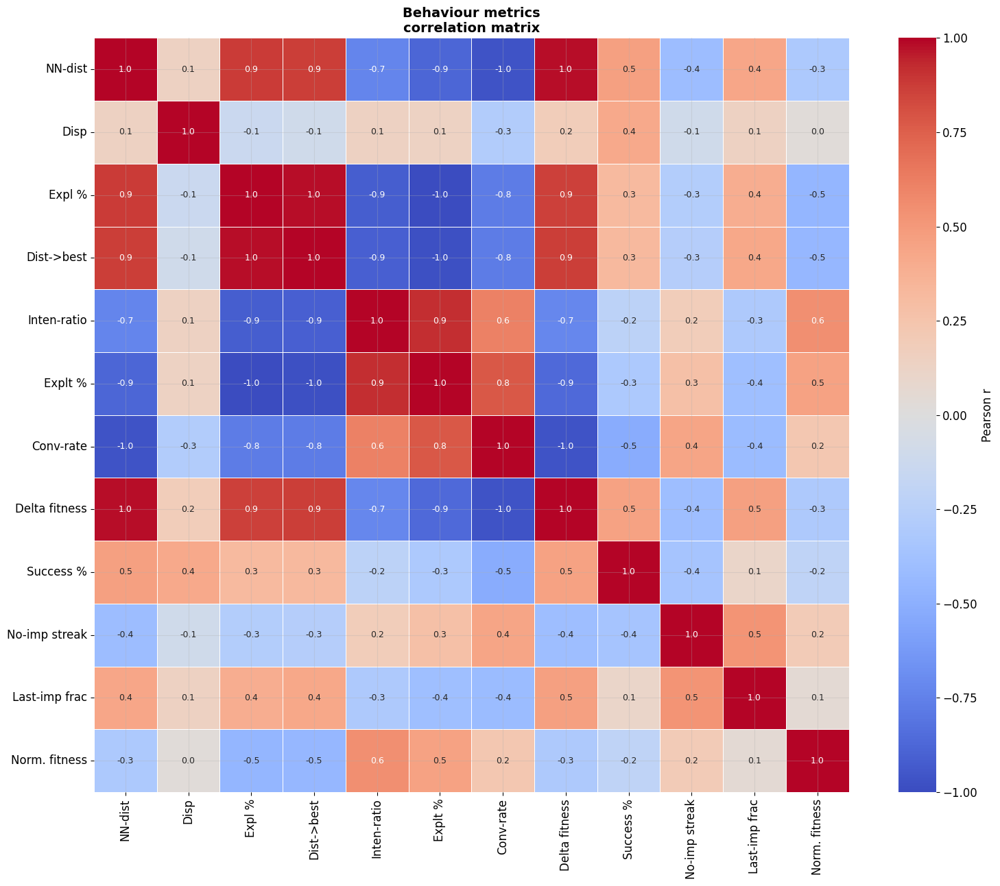

In [8]:
corr_cols = ALL_FEATS + ['aocc_norm']
corr = df[corr_cols].corr()
corr_plot = corr.rename(columns=NICE_NAMES, index=NICE_NAMES)

fig, ax = plt.subplots(figsize=(16, 13))
sns.heatmap(
    corr_plot,
    cmap='coolwarm', center=0, vmin=-1, vmax=1,
    square=True, linewidths=0.5,
    annot=True, fmt='.1f', annot_kws={'size': 9},
    cbar_kws=dict(label='Pearson r'),
    ax=ax,
)
ax.set_title('Behaviour metrics\ncorrelation matrix', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

### 8a. Identify Redundant Feature Pairs

Flags pairs with |r| >= threshold and recommends which to drop.

In [9]:
feat_corr    = df[ALL_FEATS].corr()
fitness_corr = df[ALL_FEATS + ['aocc_norm']].corr()['aocc_norm'].drop('aocc_norm').abs()

redundant_pairs = []
for i, f1 in enumerate(ALL_FEATS):
    for j, f2 in enumerate(ALL_FEATS):
        if j <= i:
            continue
        r = feat_corr.loc[f1, f2]
        if abs(r) >= REDUNDANCY_THRESHOLD:
            keep = f1 if fitness_corr[f1] >= fitness_corr[f2] else f2
            drop = f2 if keep == f1 else f1
            redundant_pairs.append({
                'Feature A':        NICE_NAMES.get(f1, f1),
                'Feature B':        NICE_NAMES.get(f2, f2),
                'Pearson r':        round(r, 2),
                'Recommended keep': NICE_NAMES.get(keep, keep),
                'Recommended drop': NICE_NAMES.get(drop, drop),
            })

rp_df = pd.DataFrame(redundant_pairs)
print(f'Redundant pairs (|r| >= {REDUNDANCY_THRESHOLD}):')
display(rp_df)

inv     = {v: k for k, v in NICE_NAMES.items()}
to_drop = {inv.get(r['Recommended drop'], r['Recommended drop']) for r in redundant_pairs}
selected_feats = [f for f in ALL_FEATS if f not in to_drop]

print(f'\nSelected non-redundant features ({len(selected_feats)}):')
for f in selected_feats:
    print(f'  {NICE_NAMES.get(f, f)}')

print("\nPaper's 5 selected features (for reference):")
for f in STN_FEATS:
    print(f'  {NICE_NAMES.get(f, f)}')

Redundant pairs (|r| >= 0.7):


,Feature A,Feature B,Pearson r,Recommended keep,Recommended drop
0,NN-dist,Expl %,0.88,Expl %,NN-dist
1,NN-dist,Dist->best,0.87,Dist->best,NN-dist
2,NN-dist,Inten-ratio,-0.73,Inten-ratio,NN-dist
3,NN-dist,Explt %,-0.88,Explt %,NN-dist
4,NN-dist,Conv-rate,-0.96,NN-dist,Conv-rate
5,NN-dist,Delta fitness,0.98,NN-dist,Delta fitness
6,Expl %,Dist->best,0.98,Expl %,Dist->best
7,Expl %,Inten-ratio,-0.92,Inten-ratio,Expl %
8,Expl %,Explt %,-1.00,Expl %,Explt %
9,Expl %,Conv-rate,-0.77,Expl %,Conv-rate



Selected non-redundant features (5):
  Disp
  Inten-ratio
  Success %
  No-imp streak
  Last-imp frac

Paper's 5 selected features (for reference):
  Expl %
  Conv-rate
  Delta fitness
  Success %
  No-imp streak


## 9. Step 2 -- Behaviour Profile (All Algorithms, Quartile Colour)

Replicates Figure 4 (left panel) from the paper.

Each polyline = one generated algorithm (aggregated over instances).
Colour = AOCC quartile: Q1 blue = poor performers, Q4 dark red = best.
The dark-red cluster is the gold standard behaviour profile.

The paper found Q4 algorithms show: low NN-dist, average Disp,
low Expl %, and focused exploitation behaviour.

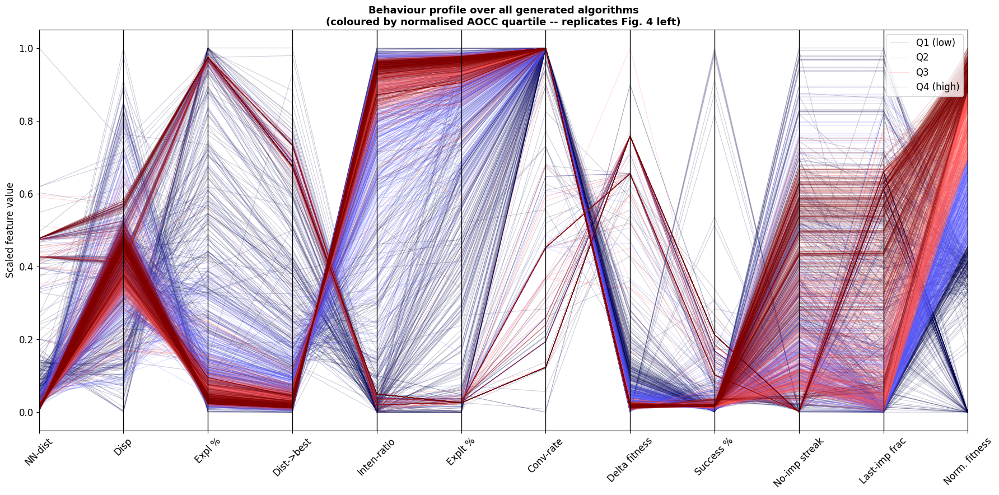

In [10]:
pc = df[ALL_FEATS + ['aocc_norm']].copy()

for feat in ALL_FEATS:
    lo, hi = pc[feat].min(), pc[feat].max()
    pc[feat] = (pc[feat] - lo) / (hi - lo + 1e-12)

pc['fitness_group'] = pd.qcut(
    pc['aocc_norm'], 4, labels=QUARTILE_LABELS, duplicates='drop'
).astype(QUART_CAT)
pc = pc.sort_values('fitness_group', key=lambda s: s.cat.codes)

fig, ax = plt.subplots(figsize=(18, 9))
parallel_coordinates(
    pc.rename(columns=NICE_NAMES), 'fitness_group',
    ax=ax, alpha=0.2, linewidth=0.8, colormap='seismic',
)
ax.set_title(
    'Behaviour profile over all generated algorithms\n'
    '(coloured by normalised AOCC quartile -- replicates Fig. 4 left)',
    fontsize=13, fontweight='bold',
)
ax.set_ylabel('Scaled feature value')
ax.tick_params(axis='x', rotation=45)
plt.tight_layout()
plt.show()

### 9a. Top-100 Algorithms per Method

Adapted from Figure 4 (right panel): top-100 per method instead of per function.
Each line = one algorithm, coloured by method.

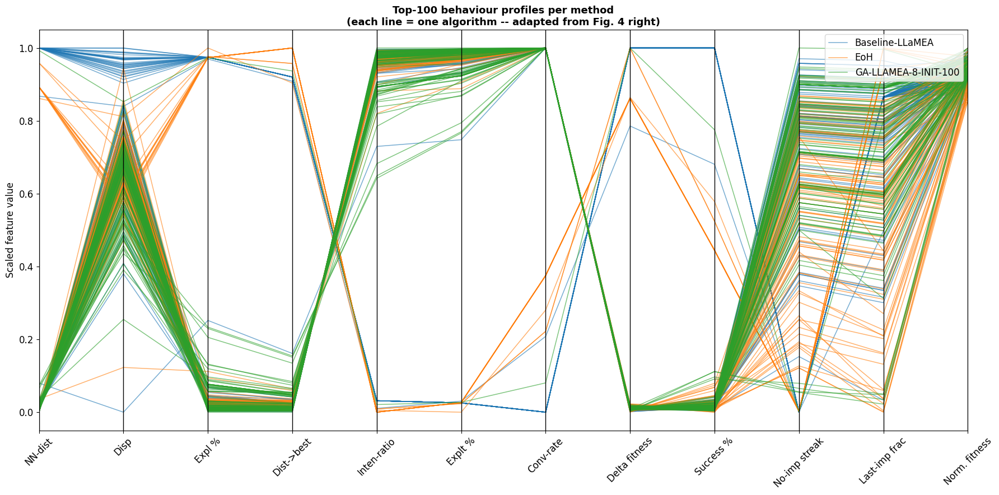

In [11]:
TOP_K = 100
method_list = sorted(df['method_name'].unique())

pieces = []
for method in method_list:
    sub   = df[df['method_name'] == method].copy()
    topk  = sub.nlargest(min(TOP_K, len(sub)), 'aocc')
    frame = topk[ALL_FEATS + ['aocc_norm']].copy()
    frame['method'] = method
    pieces.append(frame)

top_df = pd.concat(pieces, ignore_index=True)
for feat in ALL_FEATS:
    lo, hi = top_df[feat].min(), top_df[feat].max()
    top_df[feat] = (top_df[feat] - lo) / (hi - lo + 1e-12)

cmap   = plt.get_cmap('tab10')
colors = [cmap(i) for i in range(len(method_list))]

fig, ax = plt.subplots(figsize=(18, 9))
parallel_coordinates(
    top_df.rename(columns=NICE_NAMES), 'method',
    ax=ax, alpha=0.6, linewidth=1.1, color=colors,
)
ax.set_title(
    f'Top-{TOP_K} behaviour profiles per method\n'
    '(each line = one algorithm -- adapted from Fig. 4 right)',
    fontsize=13, fontweight='bold',
)
ax.set_ylabel('Scaled feature value')
ax.tick_params(axis='x', rotation=45)
plt.tight_layout()
plt.show()

### 9b. Per-Method Behaviour Profile

One plot per method, each algorithm coloured by its AOCC quartile within that method.
Compare the Q4 (dark red) profile against the universal gold standard from Section 9.

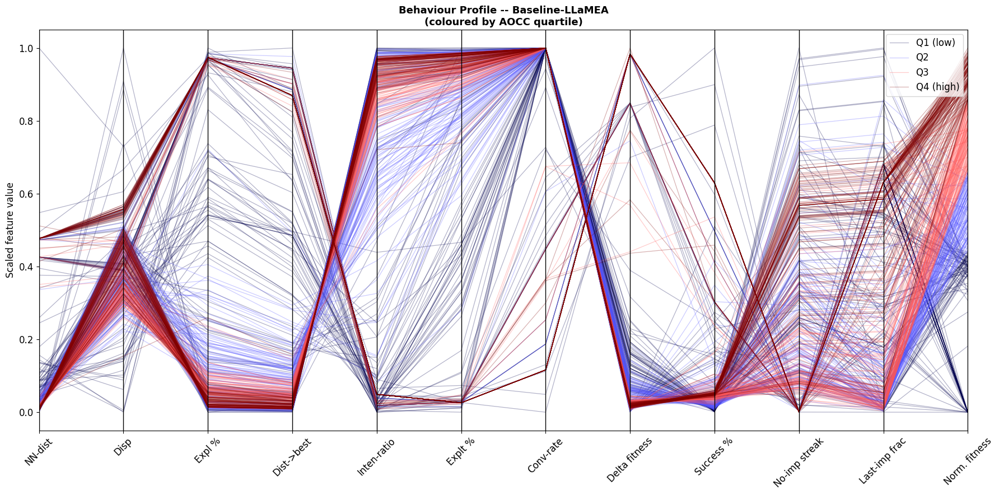

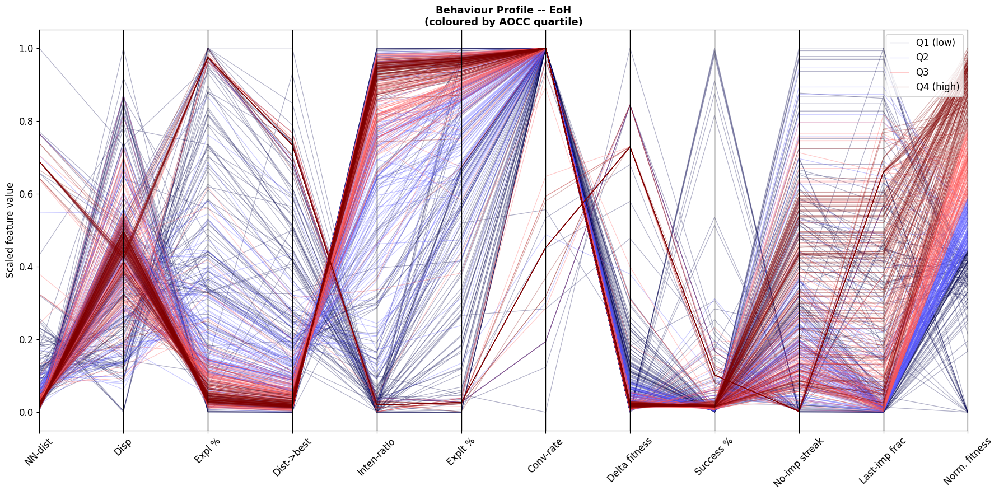

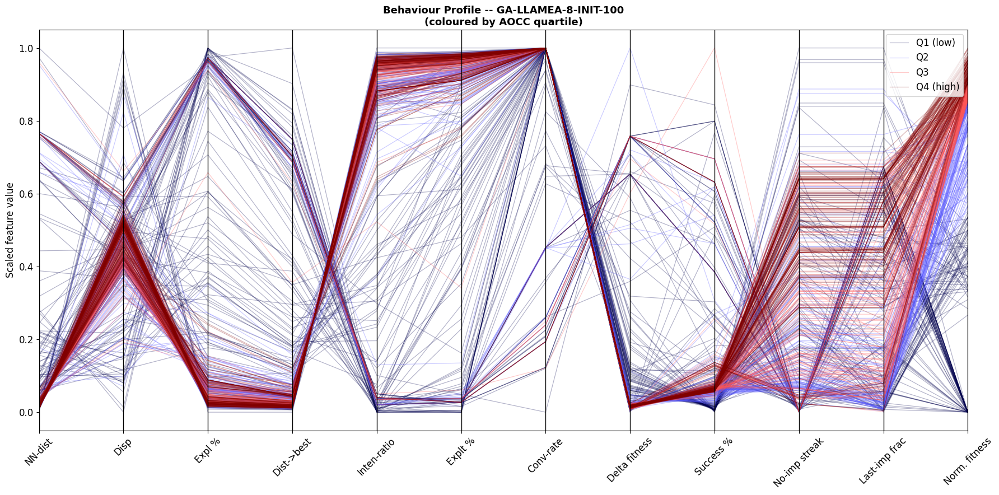

In [12]:
for method in method_list:
    sub = df[df['method_name'] == method][ALL_FEATS + ['aocc_norm']].copy()
    for feat in ALL_FEATS:
        lo, hi = sub[feat].min(), sub[feat].max()
        sub[feat] = (sub[feat] - lo) / (hi - lo + 1e-12)

    sub['fitness_group'] = pd.qcut(
        sub['aocc_norm'], 4, labels=QUARTILE_LABELS, duplicates='drop'
    ).astype(QUART_CAT)
    sub = sub.sort_values('fitness_group', key=lambda s: s.cat.codes)

    fig, ax = plt.subplots(figsize=(18, 9))
    parallel_coordinates(
        sub.rename(columns=NICE_NAMES), 'fitness_group',
        ax=ax, alpha=0.3, linewidth=0.9, colormap='seismic',
    )
    ax.set_title(
        f'Behaviour Profile -- {method}\n(coloured by AOCC quartile)',
        fontsize=13, fontweight='bold',
    )
    ax.set_ylabel('Scaled feature value')
    ax.tick_params(axis='x', rotation=45)
    plt.tight_layout()
    plt.show()

## 10. Diagnosing Method Differences via the Gold Standard

The paper's key analytical move (Sections 4.3 and 5):
1. Read the Q4 median profile from Section 9 -- the gold standard.
2. Compare each method's median algorithm behaviour against that standard.

Example from the paper: LLaMEA-2's poor performance was attributed to its
low success rate and high stagnation -- an overly exploratory profile.

In [13]:
q4_threshold  = df['aocc_norm'].quantile(0.75)
gold_standard = df[df['aocc_norm'] >= q4_threshold][ALL_FEATS].median().rename('Q4 Gold Standard')

method_medians = df.groupby('method_name')[ALL_FEATS + ['aocc']].median()

combined = method_medians[ALL_FEATS].T.copy()
combined['Q4 Gold Standard'] = gold_standard
combined.index = [NICE_NAMES.get(f, f) for f in combined.index]
combined = combined.round(4)

print('Median behaviour metrics per method vs. Q4 Gold Standard')
display(
    combined.style
    .background_gradient(cmap='RdYlGn', axis=1)
    .set_table_styles([
        {'selector': 'th', 'props': [('background-color', '#2c3e50'), ('color', 'white'),
                                      ('font-weight', 'bold'), ('text-align', 'center')]},
        {'selector': 'td', 'props': [('text-align', 'center'), ('padding', '5px 10px')]},
    ])
    .format('{:.4f}')
)

print('\nMedian AOCC per method:')
print(method_medians[['aocc']].rename(columns={'aocc': 'Median AOCC'}).round(4))

Median behaviour metrics per method vs. Q4 Gold Standard


method_name,Baseline-LLaMEA,EoH,GA-LLAMEA-8-INIT-100,Q4 Gold Standard
NN-dist,0.1827,0.1937,0.1358,0.1018
Disp,6.9488,7.0399,6.9704,7.4160
Expl %,9.7038,10.9453,6.6566,4.0268
Dist->best,0.6312,0.7277,0.4241,0.2441
Inten-ratio,0.8362,0.7761,0.8927,0.9395
Explt %,90.2962,89.0547,93.3434,95.9732
Conv-rate,0.9962,0.9962,0.9962,0.9962
Delta fitness,0.1681,0.1437,0.1242,0.1122
Success %,0.0089,0.0085,0.0091,0.0092
No-imp streak,1753.2500,1924.2500,2795.0000,4482.0000



Median AOCC per method:
                      Median AOCC
method_name                      
Baseline-LLaMEA            0.5646
EoH                        0.4936
GA-LLAMEA-8-INIT-100       0.7376


## 11. Behaviour Profile -- 5 Non-Redundant Features (Paper STN Metrics)

Parallel coordinates using only the 5 least-correlated features from Section 8a,
matching the paper's STN analysis: Expl %, Conv-rate, Delta fitness, Success %, No-imp streak.

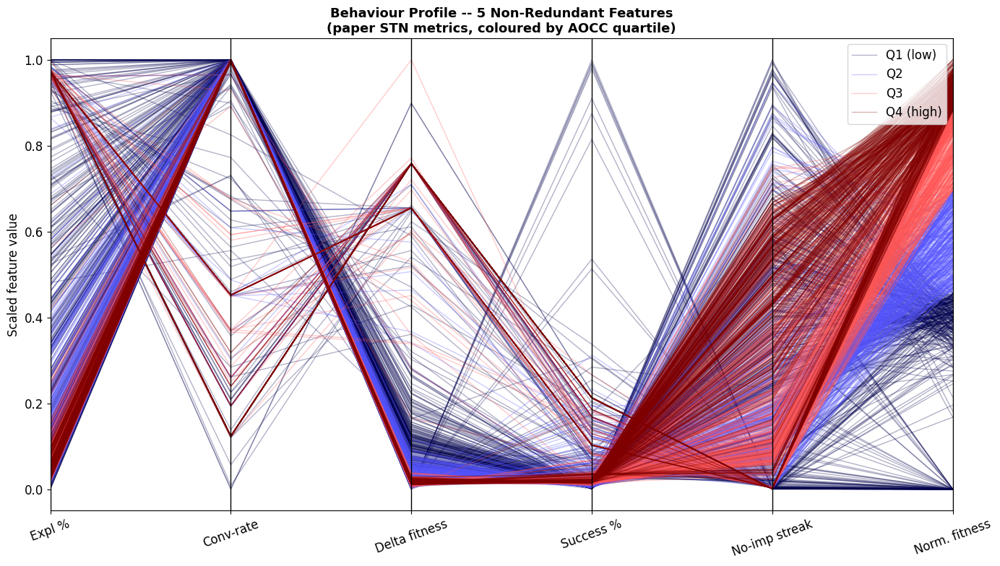

In [14]:
pc_stn = df[STN_FEATS + ['aocc_norm']].copy()

for feat in STN_FEATS:
    lo, hi = pc_stn[feat].min(), pc_stn[feat].max()
    pc_stn[feat] = (pc_stn[feat] - lo) / (hi - lo + 1e-12)

pc_stn['fitness_group'] = pd.qcut(
    pc_stn['aocc_norm'], 4, labels=QUARTILE_LABELS, duplicates='drop'
).astype(QUART_CAT)
pc_stn = pc_stn.sort_values('fitness_group', key=lambda s: s.cat.codes)

fig, ax = plt.subplots(figsize=(14, 8))
parallel_coordinates(
    pc_stn.rename(columns=NICE_NAMES), 'fitness_group',
    ax=ax, alpha=0.3, linewidth=1.0, colormap='seismic',
)
ax.set_title(
    'Behaviour Profile -- 5 Non-Redundant Features\n'
    '(paper STN metrics, coloured by AOCC quartile)',
    fontsize=13, fontweight='bold',
)
ax.set_ylabel('Scaled feature value')
ax.tick_params(axis='x', rotation=20)
plt.tight_layout()
plt.show()

## 12. Summary

| Step | What it does | Paper Figure |
|------|--------------|--------------||
| Section 8 Correlation heatmap | Feature selection -- identify redundant pairs | Fig. 3 |
| Section 9 Parallel coords (all algorithms) | Gold standard behaviour profile | Fig. 4 left |
| Section 9a Top-100 per method | Best algorithms behaviour by method | Fig. 4 right |
| Section 9b Per-method parallel coords | Diagnose within-method variation | -- |
| Section 10 Gold standard table | Quantify deviation from ideal profile | Sections 4.3/5 |
| Section 11 STN-feature profile | 5-feature view matching paper STN analysis | Fig. 4 + Section 3.3 |